In [2]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import pandas as pd
import ipywidgets
import sdeint
import pycatch22 as catch22
from sklearn.manifold import TSNE
import random
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import pickle

## Hopf

In [255]:
np.random.seed(42)
num_samples = 10000 # 57 mins
eta_val = list()
mu_val = list()
sols_list = list()
dt = 0.01
tspan = np.arange(0, 55, dt)
for i in range(num_samples):
    if (i+1)%100 == 0:
        print(f'{i+1}/{num_samples}')
    mu = np.random.uniform(-1, 1) # uniform random mu value
    eta = np.random.uniform(0.01, 0.7) # uniform random eta value
    eta_val.append(eta)
    mu_val.append(mu)
    def f(state, t):
        x, y = state[0], state[1]
        dxdt = -y + (mu - x **2 - y**2) * x
        dydt = x + (mu - x ** 2 - y **2) * y
        return dxdt, dydt
    ic = np.array(np.random.uniform(size=2)) # uniform random initial conditions
    gw = lambda y, t: eta * np.identity(ic.shape[0]) # noise is relative to ic's 
    fw = lambda y, t: np.array(f(y,t))
    sol = sdeint.itoint(fw, gw, np.array(ic), tspan)
    sols_list.append(sol[500:]) # cut out first 500 time points


100/10000
200/10000
300/10000
400/10000
500/10000
600/10000
700/10000
800/10000
900/10000
1000/10000
1100/10000
1200/10000
1300/10000
1400/10000
1500/10000
1600/10000
1700/10000
1800/10000
1900/10000
2000/10000
2100/10000
2200/10000
2300/10000
2400/10000
2500/10000
2600/10000
2700/10000
2800/10000
2900/10000
3000/10000
3100/10000
3200/10000
3300/10000
3400/10000
3500/10000
3600/10000
3700/10000
3800/10000
3900/10000
4000/10000
4100/10000
4200/10000
4300/10000
4400/10000
4500/10000
4600/10000
4700/10000
4800/10000
4900/10000
5000/10000
5100/10000
5200/10000
5300/10000
5400/10000
5500/10000
5600/10000
5700/10000
5800/10000
5900/10000
6000/10000
6100/10000
6200/10000
6300/10000
6400/10000
6500/10000
6600/10000
6700/10000
6800/10000
6900/10000
7000/10000
7100/10000
7200/10000
7300/10000
7400/10000
7500/10000
7600/10000
7700/10000
7800/10000
7900/10000
8000/10000
8100/10000
8200/10000
8300/10000
8400/10000
8500/10000
8600/10000
8700/10000
8800/10000
8900/10000
9000/10000
9100/10000
9200/100

Extract features

In [256]:
TS = np.array([sols_list[i][:,0] for i in range(len(sols_list))]) # extract x component
FEATURES = np.array([catch22.catch22_all(TS[i,:])['values'] for i in range(len(sols_list))])

In [257]:
#with open('hopfXY_FE.pkl', 'wb') as f:
#    pickle.dump(FEATURES, f)
#with open('hopfXY_TS.pkl', 'wb') as f:
#    pickle.dump(TS, f)
#with open('hopfXY_params.pkl', 'wb') as f:
#    pickle.dump(np.array([mu_val, eta_val]), f)

In [258]:
with open('hopfXY_FE.pkl', 'rb') as f:
    FEATURES_hopf = pickle.load(f)
with open('hopfXY_params.pkl', 'rb') as f:
    hopf_params = pickle.load(f)
mu_val_hopf = hopf_params[0,:]
eta_val_hopf = hopf_params[1,:]

In [259]:
normalized_features = StandardScaler().fit_transform(FEATURES_hopf)
pca_reducer = PCA(n_components=2)
embedding_hopf = pca_reducer.fit_transform(normalized_features)

In [260]:
marker_norm = eta_val_hopf/np.max(eta_val_hopf) * 5 # rescale marker sizes

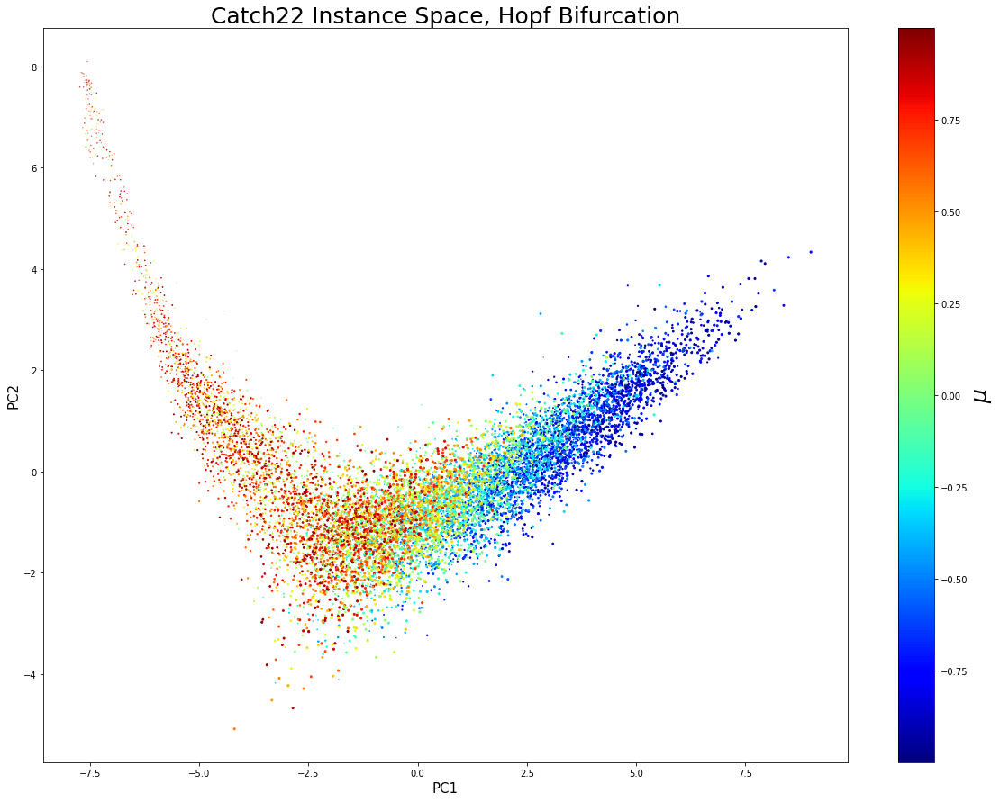

In [261]:
plt.figure(figsize=(20,15))
plt.scatter(embedding_hopf[:,0], embedding_hopf[:,1], s=marker_norm, c=mu_val_hopf, cmap='jet')
plt.xlabel('PC1', fontsize=15)
plt.ylabel('PC2', fontsize=15)
plt.title('Catch22 Instance Space, Hopf Bifurcation', fontsize=25)
plt.colorbar().set_label('$\mu$', fontsize=25)
plt.show()

## Bistable

In [262]:
np.random.seed(42)
num_samples = 10000 # 49 mins
eta_val = list()
mu_val = list()
sols_list = list()
dt = 0.01
tspan = np.arange(0, 55, dt)
for i in range(num_samples):
    if (i+1)%100 == 0:
        print(f'{i+1}/{num_samples}')
    mu = np.random.uniform(-1, 1) # uniform random mu value
    eta = np.random.uniform(0.01, 0.7) # uniform random eta value
    eta_val.append(eta)
    mu_val.append(mu)
    def f(state, t):
        x = state
        dxdt = mu + x - x**3
        return dxdt 
    ic = np.array([np.random.uniform()]) # uniform random initial conditions
    gw = lambda y, t: eta * np.identity(ic.shape[0]) # noise is relative to ic's 
    fw = lambda y, t: np.array(f(y,t))
    sol = sdeint.itoint(fw, gw, np.array(ic), tspan)
    sols_list.append(sol[500:]) # cut out first 500 time points

KeyboardInterrupt: 

In [ ]:
TS = np.array([sols_list[i][:,0] for i in range(len(sols_list))]) # extract x component
FEATURES = np.array([catch22.catch22_all(TS[i,:])['values'] for i in range(len(sols_list))])

KeyboardInterrupt: 

In [ ]:
#with open('bistable_FE.pkl', 'wb') as f:
#    pickle.dump(FEATURES, f)
#with open('bistable_TS.pkl', 'wb') as f:
#    pickle.dump(TS, f)
#with open('bistable_params.pkl', 'wb') as f:
#    pickle.dump(np.array([mu_val, eta_val]), f)

In [276]:
with open('bistable_FE.pkl', 'rb') as f:
    FEATURES_bistable = pickle.load(f)
with open('bistable_params.pkl', 'rb') as f:
    bistable_params = pickle.load(f)
mu_val_bistable = bistable_params[0,:]
eta_val_bistable = bistable_params[1,:]

In [277]:
normalized_features = StandardScaler().fit_transform(FEATURES_bistable)
pca_reducer = PCA(n_components=2)
embedding = pca_reducer.fit_transform(normalized_features)

In [278]:
marker_norm = eta_val_bistable/np.max(eta_val_bistable) * 5 # rescale marker sizes

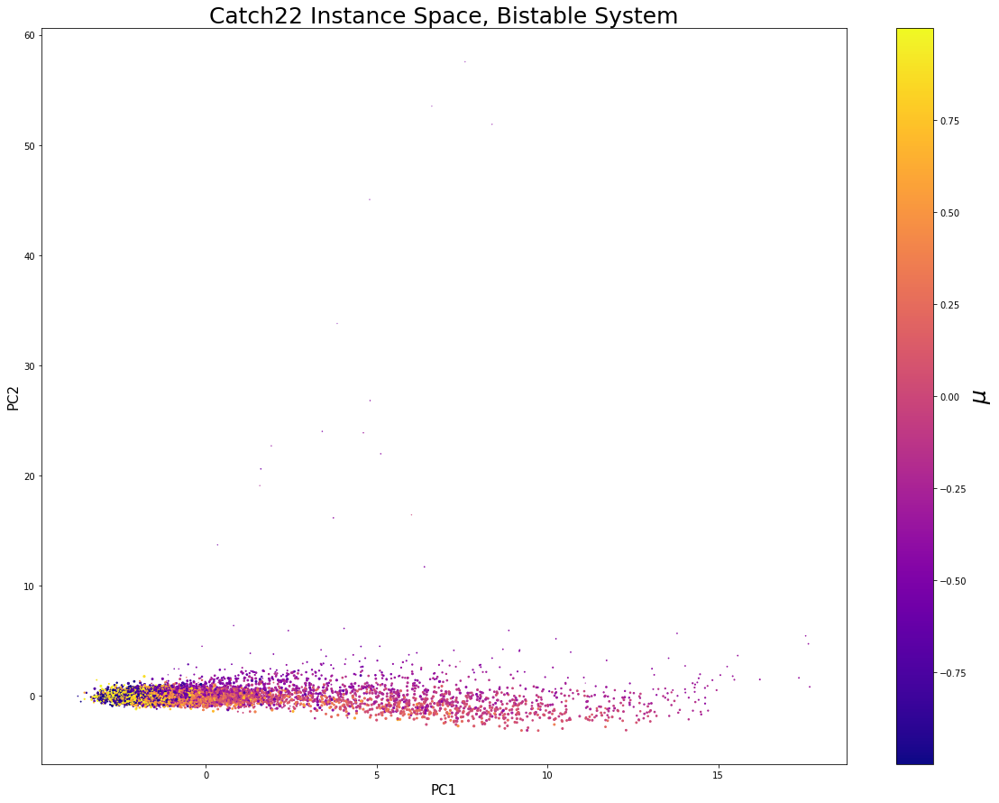

In [279]:
plt.figure(figsize=(20,15))
plt.scatter(embedding[:,0], embedding[:,1], s=marker_norm, c=mu_val_bistable, cmap='plasma')
plt.xlabel('PC1', fontsize=15)
plt.ylabel('PC2', fontsize=15)
plt.title('Catch22 Instance Space, Bistable System', fontsize=25)
plt.colorbar().set_label('$\mu$', fontsize=25)
plt.show()

## Combined Instance Space

In [267]:
with open('bistable_FE.pkl', 'rb') as f:
    bistable_FE = pickle.load(f)
with open('hopfXY_FE.pkl', 'rb') as f:
    hopfXY_FE = pickle.load(f)
with open('bistable_params.pkl', 'rb') as f:
    bistable_params = pickle.load(f)
with open('hopfXY_params.pkl', 'rb') as f:
    hopf_params = pickle.load(f)

In [268]:
FEATURES = np.vstack([bistable_FE, hopfXY_FE])
normalized_features = StandardScaler().fit_transform(FEATURES)
pca_reducer = PCA(n_components=2)
embedding = pca_reducer.fit_transform(normalized_features)

In [184]:
feature_names = ['DN_HistogramMode_5',
        'DN_HistogramMode_10',
        'CO_f1ecac',
        'CO_FirstMin_ac',
        'CO_HistogramAMI_even_2_5',
        'CO_trev_1_num',
        'MD_hrv_classic_pnn40',
        'SB_BinaryStats_mean_longstretch1',
        'SB_TransitionMatrix_3ac_sumdiagcov',
        'PD_PeriodicityWang_th0_01',
        'CO_Embed2_Dist_tau_d_expfit_meandiff',
        'IN_AutoMutualInfoStats_40_gaussian_fmmi',
        'FC_LocalSimple_mean1_tauresrat',
        'DN_OutlierInclude_p_001_mdrmd',
        'DN_OutlierInclude_n_001_mdrmd',
        'SP_Summaries_welch_rect_area_5_1',
        'SB_BinaryStats_diff_longstretch0',
        'SB_MotifThree_quantile_hh',
        'SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1',
        'SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1',
        'SP_Summaries_welch_rect_centroid',
        'FC_LocalSimple_mean3_stderr']

Construct DataFrame

In [270]:
df_bistable = pd.DataFrame(embedding[:10000])
df_bistable['mu'] = bistable_params[0, :]
df_bistable['eta'] = bistable_params[1, :]
df_bistable['system'] = 'Bistable'
df_hopf = pd.DataFrame(embedding[10000:])
df_hopf['mu'] = hopf_params[0, :]
df_hopf['eta'] = hopf_params[1, :]
df_hopf['system'] = 'Hopf'
df = pd.concat([df_bistable, df_hopf]) # leave out ignore index so can plot TS data easier for each system in isolation

Rescale marker size

In [271]:
rescaled_marker = df['eta'].to_numpy()
rescaled_marker = rescaled_marker/np.max(rescaled_marker) 

Visualise

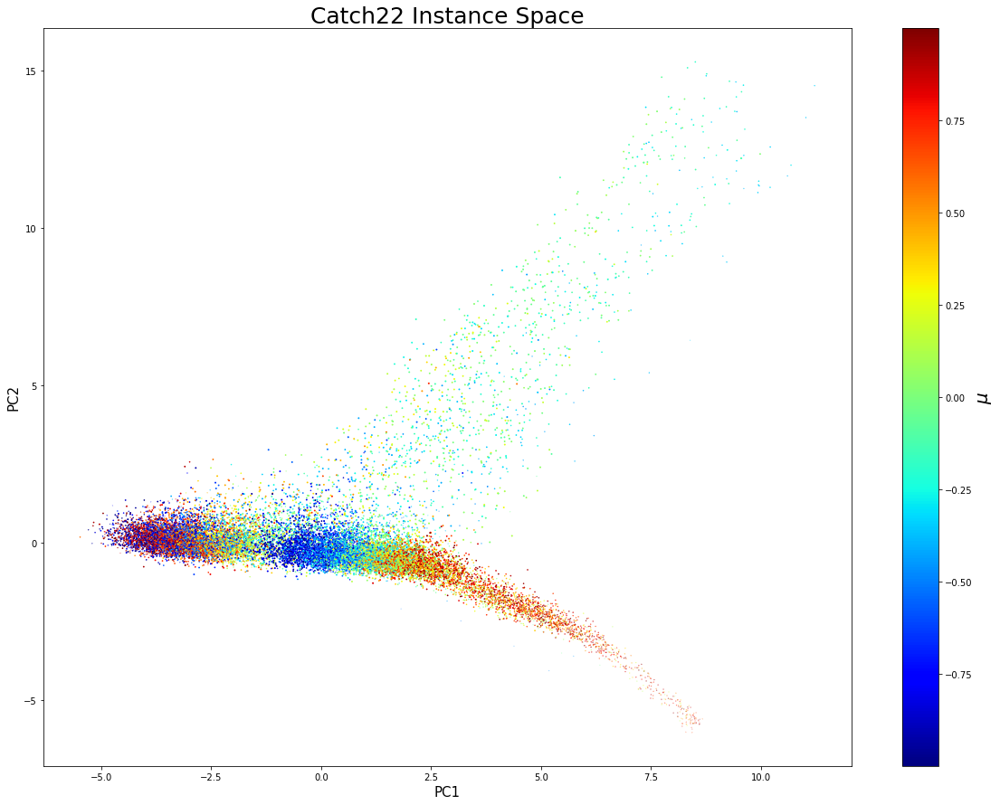

In [273]:
plt.figure(figsize=(20,15))
plt.scatter(df[0], df[1], s=rescaled_marker, c=df['mu'], cmap='jet')
plt.colorbar().set_label('$\mu$', fontsize=20)
plt.xlabel('PC1', fontsize=15)
plt.ylabel('PC2', fontsize=15)
plt.title('Catch22 Instance Space', fontsize=25)
plt.show()

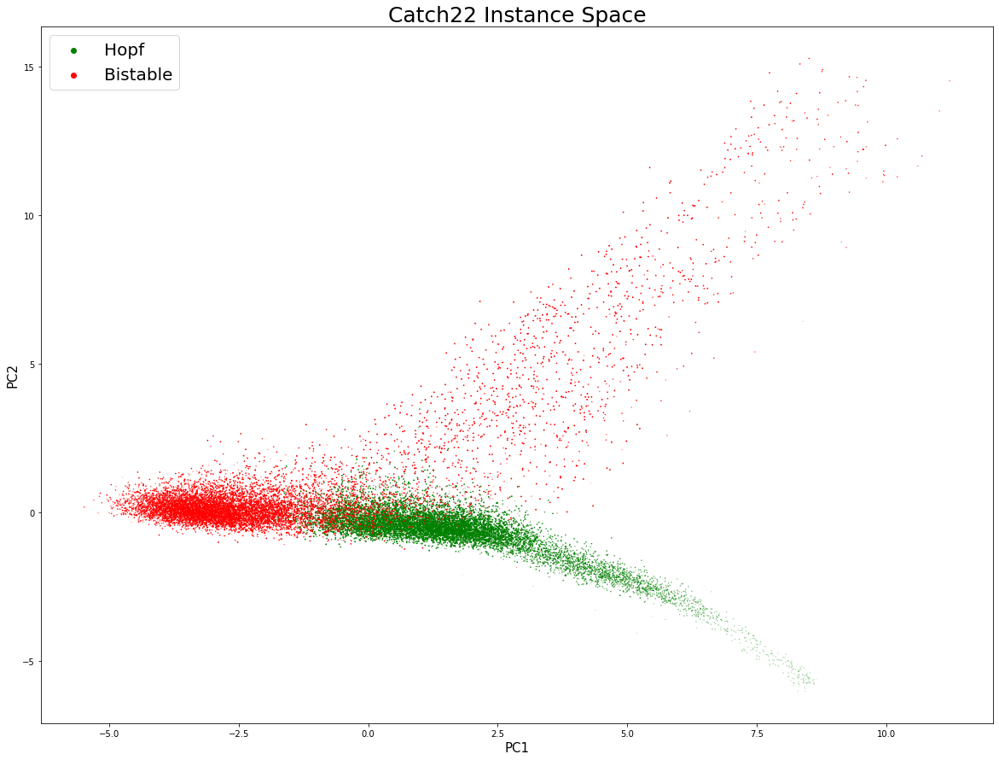

In [274]:
plt.figure(figsize=(20,15))
plt.scatter(df[df['system'] == 'Hopf'][0], df[df['system'] == 'Hopf'][1], s=df[df['system'] == 'Hopf']['eta'], label='Hopf', c='g')
plt.scatter(df[df['system'] == 'Bistable'][0], df[df['system'] == 'Bistable'][1],s =df[df['system'] == 'Bistable']['eta'],label='Bistable', c='r')
plt.legend(fontsize=20, markerscale=10.)
plt.xlabel('PC1', fontsize=15)
plt.ylabel('PC2', fontsize=15)
plt.title('Catch22 Instance Space', fontsize=25)
plt.show()

Fixed Point Overlap

In [280]:
normalized_marker = df.loc[(df['system'] == 'Hopf') & (df['mu'] < 0)]['eta']/np.max(df.loc[(df['system'] == 'Hopf') & (df['mu'] < 0)]['eta'])
normalized_marker *= 5

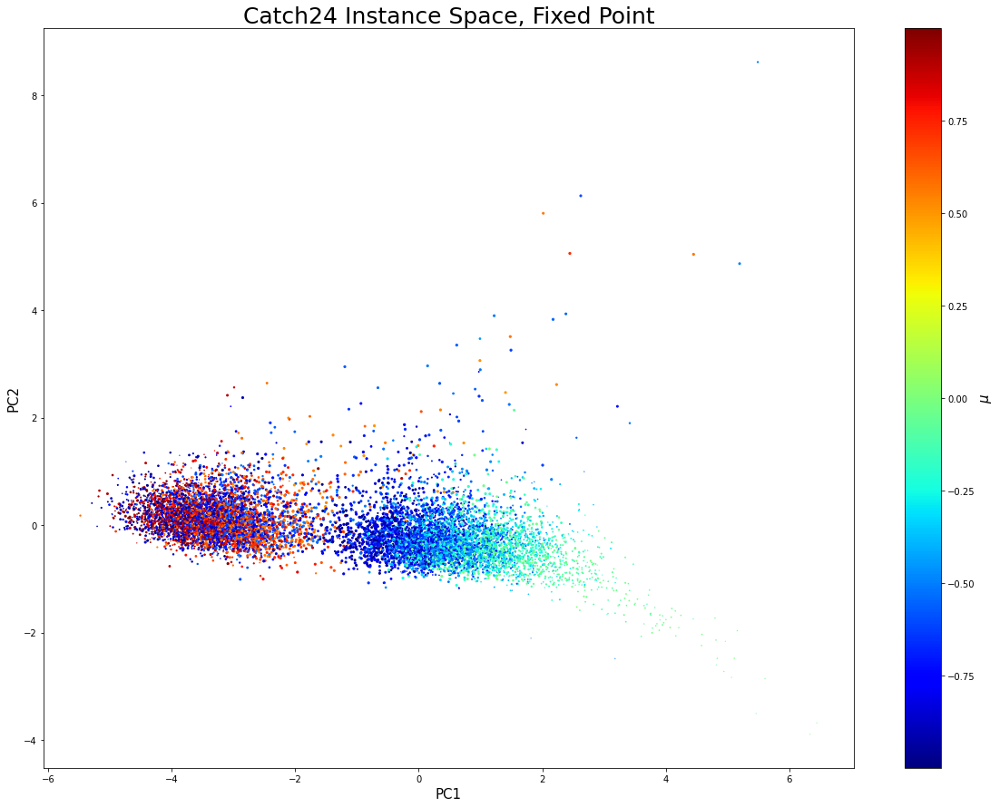

In [281]:
interest = df.loc[((df['system'] == 'Hopf') & (df['mu'] < 0)) | (df['system'] == 'Bistable') & ((df['mu'] < -0.5) | (df['mu'] > 0.5))]
rescaled_marker = interest['eta']/np.max(interest['eta']) * 5
plt.figure(figsize=(20,15))
plt.scatter(interest[0], interest[1], s=rescaled_marker, c=interest['mu'], cmap='jet')
plt.colorbar().set_label('$\mu$', fontsize=15)
#plt.legend(fontsize=20, markerscale=10.)
plt.xlabel('PC1', fontsize=15)
plt.ylabel('PC2', fontsize=15)
plt.title('Catch24 Instance Space, Fixed Point', fontsize=25)
plt.show()

Limit cycle

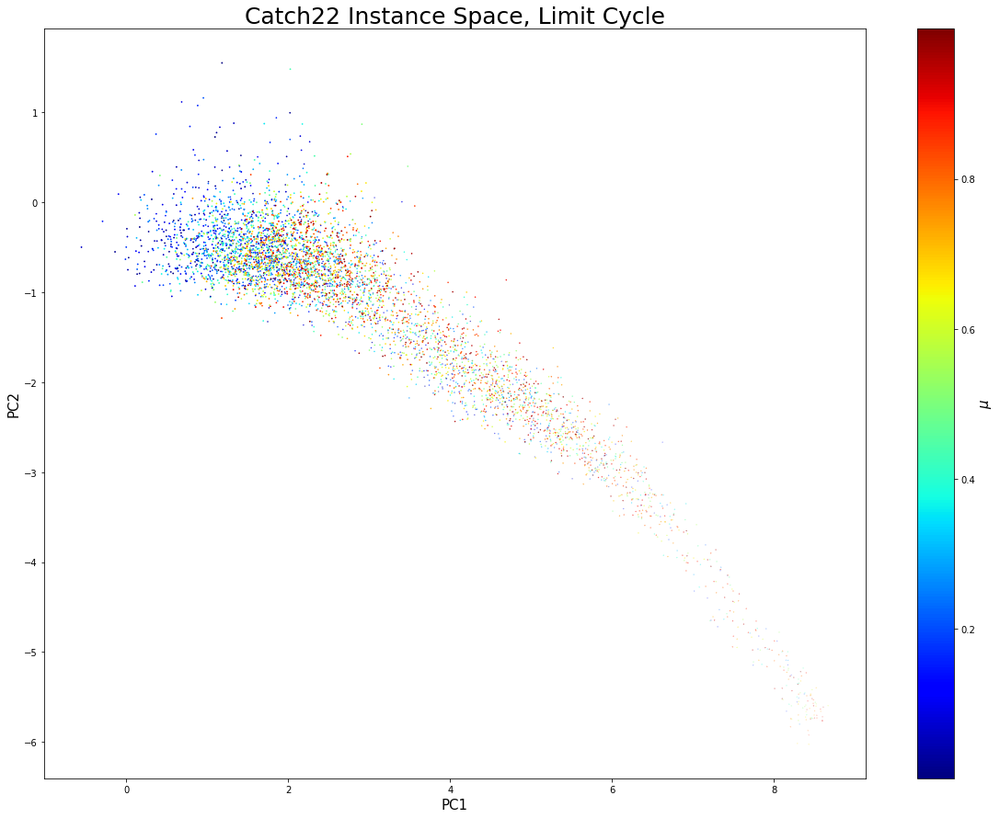

In [286]:
plt.figure(figsize=(20,15))
#plt.scatter(df[df['system'] == 'Hopf'][0], df[df['system'] == 'Hopf'][1], s=df[df['system'] == 'Hopf']['eta'], c='k', alpha=0.1)
#plt.scatter(df[df['system'] == 'Bistable'][0], df[df['system'] == 'Bistable'][1],s =df[df['system'] == 'Bistable']['eta'], c='k', alpha=0.1)
plt.scatter(df.loc[(df['system'] == 'Hopf') & (df['mu'] > 0)][0], df.loc[(df['system'] == 'Hopf') & (df['mu'] > 0)][1], 
    s=df.loc[(df['system'] == 'Hopf') & (df['mu'] > 0)]['eta'], c=df.loc[(df['system'] == 'Hopf') & (df['mu'] > 0)]['mu'],
    cmap='jet')
plt.colorbar().set_label('$\mu$', fontsize=15)
plt.xlabel('PC1', fontsize=15)
plt.ylabel('PC2', fontsize=15)
plt.title('Catch22 Instance Space, Limit Cycle', fontsize=25)
plt.show()

Bistable Region/Switching

In [283]:
interest = df.loc[(df["system"] == "Bistable") & ((df["mu"] < 0.5) & (df["mu"] > -0.5))]
interest

,0,1,mu,eta,system
0,0.340146,1.037404,-0.250920,0.665993,Bistable
1,-1.619553,-0.002303,-0.231937,0.098142,Bistable
3,-3.001291,-0.167221,-0.323825,0.667918,Bistable
7,-2.160129,0.664175,0.344573,0.090068,Bistable
8,5.176644,3.764407,-0.174236,0.369008,Bistable
...,...,...,...,...,...
9990,6.612835,11.307644,0.082342,0.422660,Bistable
9991,-1.836726,-0.094590,0.272285,0.472638,Bistable
9992,-0.500501,0.287247,-0.033008,0.149855,Bistable
9993,-1.667511,0.058216,0.185470,0.274095,Bistable


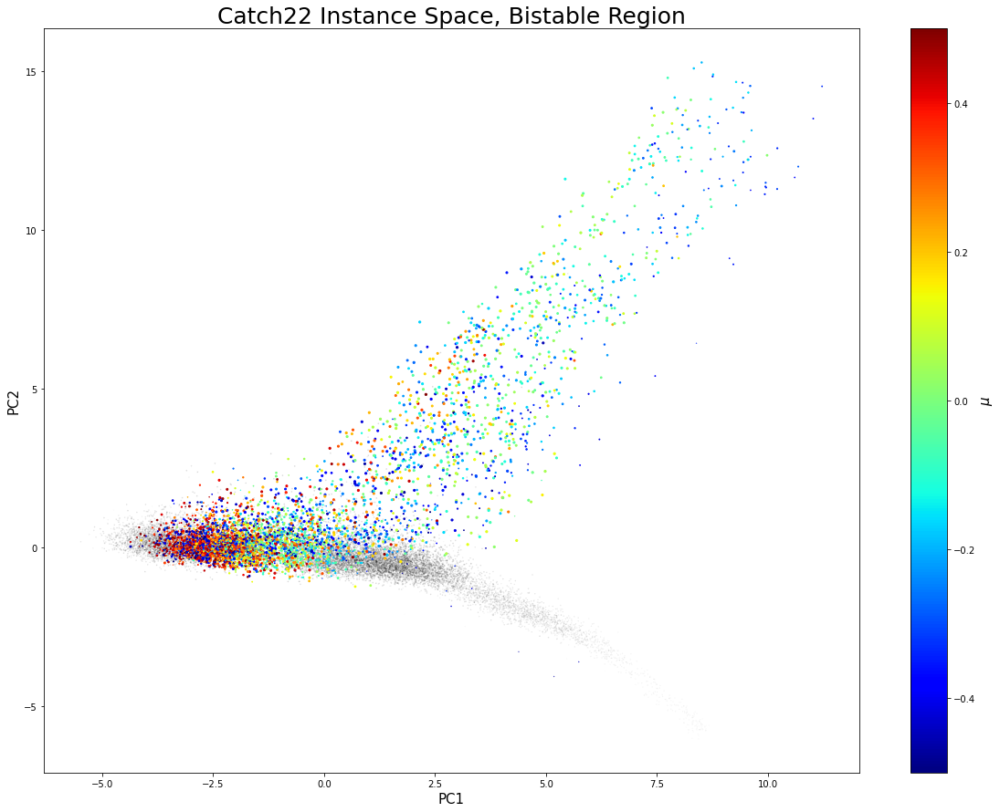

In [285]:
interest = df.loc[(df["system"] == "Bistable") & ((df["mu"] < 0.5) & (df["mu"] > -0.5))]
rescaled_marker = interest['eta']/np.max(interest['eta']) * 5
plt.figure(figsize=(20,15))
plt.scatter(df[0], df[1], c='k', alpha=0.1, s=df['eta'])
plt.scatter(interest[0], interest[1], s=rescaled_marker, c=interest['mu'], cmap='jet')
plt.colorbar().set_label('$\mu$', fontsize=15)
#plt.legend(fontsize=20, markerscale=10.)
plt.xlabel('PC1', fontsize=15)
plt.ylabel('PC2', fontsize=15)
plt.title('Catch22 Instance Space, Bistable Region', fontsize=25)
plt.show()

## Interactive Version

In [287]:
fig = px.scatter(df, x=0, y=1, color=df["mu"], template="plotly_dark",
    labels={'0': 'PC1', '1': 'PC2', 'color': r"$\lambda$"}, width=1200, height=800, custom_data=['mu', 'eta', 'system', df.index], color_continuous_scale='Jet')
fig.update_traces(
    hovertemplate="<br>".join([
        "Mu: %{customdata[0]:.3f}",
        "Eta: %{customdata[1]:.3f}",
        "System: %{customdata[2]}",
        "TS Index: %{customdata[3]}"
    ])
)
fig.update_traces(marker=dict(size=3))
fig.update_layout(title_text='Catch22 Instance Space', title_x=0.5)
fig.show()

In [206]:
with open('bistable_TS.pkl', 'rb') as f:
    TS_bistable_explore = pickle.load(f)
with open('hopfXY_TS.pkl', 'rb') as f:
    TS_hopf_explore = pickle.load(f)

In [207]:
df_bistable.loc[(df_bistable["mu"] < 0.177) & (df_bistable["mu"] > 0.175) & (df_bistable["eta"] < 0.49)]

,0,1,mu,eta,system
1830,0.050546,0.474779,0.176512,0.189805,Bistable
6883,7.513222,5.184142,0.176023,0.484553,Bistable
9671,1.994665,2.060225,0.176560,0.479943,Bistable


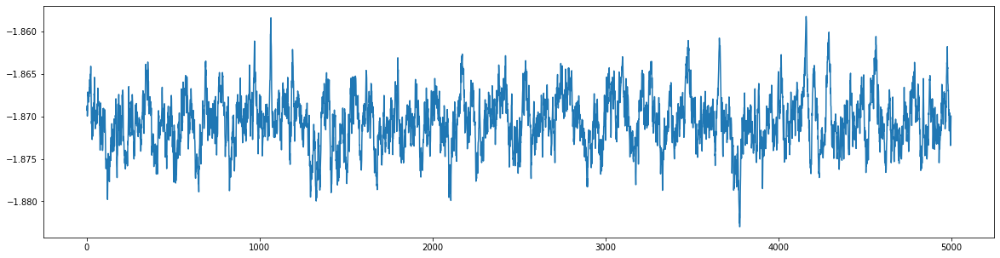

In [288]:
plt.figure(figsize=(20,5))
plt.plot(TS_bistable_explore[3416])

In [226]:
df_hopf.loc[(df_hopf["mu"] < 8.407) & (df_hopf["mu"] > 8.405) & (df_hopf["eta"] < 0.018)]

,0,1,mu,eta,system
5872,6.034566,-4.702192,8.405765,0.0166,Hopf


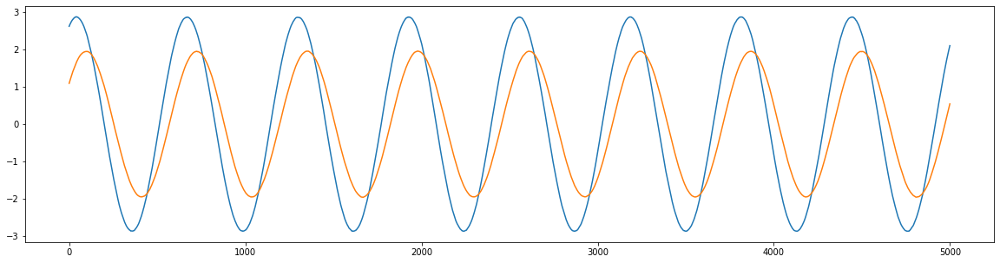

In [230]:
plt.figure(figsize=(20,5))
plt.plot(TS_hopf_explore[4297])
plt.plot(TS_hopf_explore[1181])

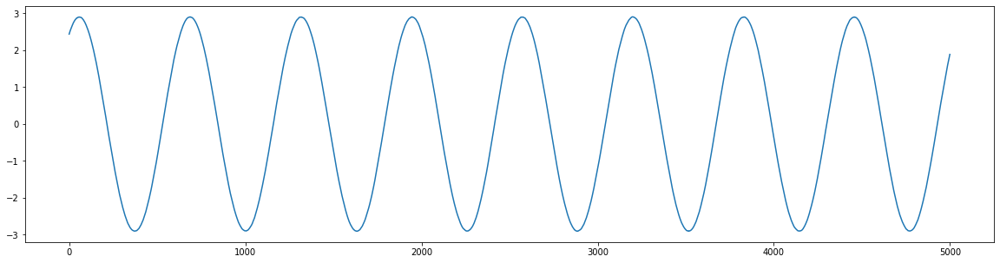

In [224]:
plt.figure(figsize=(20,5))
plt.plot(TS_hopf_explore[5872])

## Alternatives to PCA

Since PCA is not very robust to outliers, it is likely trying to fit these points at the cost of interpretability. Also from the scatter matrix, there does not appear to be much in the way of linear realtionships between variables. Will now try some non-linear methods.

In [353]:
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE

In [468]:
FEATURES = np.vstack([bistable_FE, hopfXY_FE])
normalized_features = StandardScaler().fit_transform(FEATURES)
pca_reducer = KernelPCA(n_components=2, kernel="rbf")
embedding = pca_reducer.fit_transform(normalized_features)


In [469]:
df_bistable = pd.DataFrame(embedding[:10000])
df_bistable['mu'] = bistable_params[0, :]
df_bistable['eta'] = bistable_params[1, :]
df_bistable['system'] = 'Bistable'
df_hopf = pd.DataFrame(embedding[10000:])
df_hopf['mu'] = hopf_params[0, :]
df_hopf['eta'] = hopf_params[1, :]
df_hopf['system'] = 'Hopf'
df = pd.concat([df_bistable, df_hopf]) # leave out ignore index so can plot TS data easier for each system in isolation

In [470]:
interest = df.loc[df["system"] == "Bistable"]

In [471]:
fig = px.scatter(df, x=0, y=1, color=df["mu"], template="plotly_dark",
    labels={'0': 'PC1', '1': 'PC2', 'color': r"$\lambda$"}, width=1200, height=800, custom_data=['mu', 'eta', 'system'], color_continuous_scale='Jet')
fig.update_traces(
    hovertemplate="<br>".join([
        "Mu: %{customdata[0]:.3f}",
        "Eta: %{customdata[1]:.3f}",
        "System: %{customdata[2]}",
    ])
)
fig.update_traces(marker=dict(size=3))
fig.update_layout(title_text='Catch22 Instance Space, Kernel PCA', title_x=0.5)
fig.show()

In [369]:
FEATURES = np.vstack([bistable_FE, hopfXY_FE])
normalized_features = StandardScaler().fit_transform(FEATURES)
pca_reducer = TSNE(n_components=2)
embedding = pca_reducer.fit_transform(normalized_features)

/Users/joshua/opt/anaconda3/envs/pysindy/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/Users/joshua/opt/anaconda3/envs/pysindy/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



In [371]:
df_bistable = pd.DataFrame(embedding[:10000])
df_bistable['mu'] = bistable_params[0, :]
df_bistable['eta'] = bistable_params[1, :]
df_bistable['system'] = 'Bistable'
df_hopf = pd.DataFrame(embedding[10000:])
df_hopf['mu'] = hopf_params[0, :]
df_hopf['eta'] = hopf_params[1, :]
df_hopf['system'] = 'Hopf'
df = pd.concat([df_bistable, df_hopf]) # leave out ignore index so can plot TS data easier for each system in isolation

In [372]:
fig = px.scatter(df, x=0, y=1, color=df["mu"], template="plotly_dark",
    labels={'0': 'PC1', '1': 'PC2', 'color': r"$\lambda$"}, width=1200, height=800, custom_data=['mu', 'eta', 'system'], color_continuous_scale='Jet')
fig.update_traces(
    hovertemplate="<br>".join([
        "Mu: %{customdata[0]:.3f}",
        "Eta: %{customdata[1]:.3f}",
        "System: %{customdata[2]}",
    ])
)
fig.update_traces(marker=dict(size=3))
fig.update_layout(title_text='Catch22 Instance Space, t-SNE', title_x=0.5)
fig.show()

In [373]:
from umap import UMAP

In [445]:
FEATURES = np.vstack([bistable_FE, hopfXY_FE])
normalized_features = StandardScaler().fit_transform(FEATURES)
umap_reducer = UMAP(n_neighbors=15)
embedding = umap_reducer.fit_transform(normalized_features)

In [446]:
df_bistable = pd.DataFrame(embedding[:10000])
df_bistable['mu'] = bistable_params[0, :]
df_bistable['eta'] = bistable_params[1, :]
df_bistable['system'] = 'Bistable'
df_hopf = pd.DataFrame(embedding[10000:])
df_hopf['mu'] = hopf_params[0, :]
df_hopf['eta'] = hopf_params[1, :]
df_hopf['system'] = 'Hopf'
df = pd.concat([df_bistable, df_hopf]) # leave out ignore index so can plot TS data easier for each system in isolation

In [447]:
interest = df.loc[(df["system"] == "Hopf") & (df["mu"] < 0)]

In [449]:
fig = px.scatter(df, x=0, y=1, color=df["mu"], template="plotly_dark",
    labels={'0': 'PC1', '1': 'PC2', 'color': r"$\lambda$"}, width=1200, height=800, custom_data=['mu', 'eta', 'system', df.index], color_continuous_scale='Jet')
fig.update_traces(
    hovertemplate="<br>".join([
        "Mu: %{customdata[0]:.3f}",
        "Eta: %{customdata[1]:.3f}",
        "System: %{customdata[2]}",
        "TS Index: %{customdata[3]}"
    ])
)
fig.update_traces(marker=dict(size=3))
fig.update_layout(title_text='Catch22 Instance Space, UMAP', title_x=0.5)
fig.show()

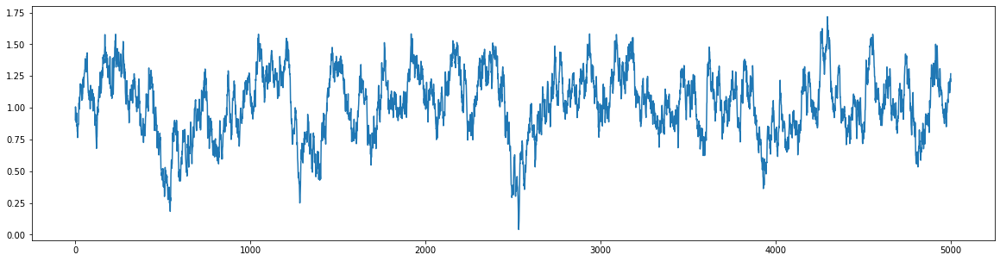

In [467]:
plt.figure(figsize=(20,5))
plt.plot(TS_bistable_explore[6169])

In [473]:
from sklearn.preprocessing import MinMaxScaler

In [475]:
FEATURES = np.vstack([bistable_FE, hopfXY_FE])
normalized_features = MinMaxScaler().fit_transform(FEATURES)
pca_reducer = PCA(n_components=2)
embedding = pca_reducer.fit_transform(normalized_features)

In [477]:
embedding.shape

(20000, 2)